In [1]:
import scvelo as scv
import scanpy as sc
import numpy as np
import pandas as pd
from IPython.display import Image
import seaborn as sns
# import celldancer as cd

# sc.set_figure_params(dpi_save=300)

# DentateGyrus (P12 and P35)

AnnData object with n_obs × n_vars = 2930 × 13913
    obs: 'clusters', 'age(days)', 'clusters_enlarged'
    uns: 'clusters_colors'
    obsm: 'X_umap'
    layers: 'ambiguous', 'spliced', 'unspliced'


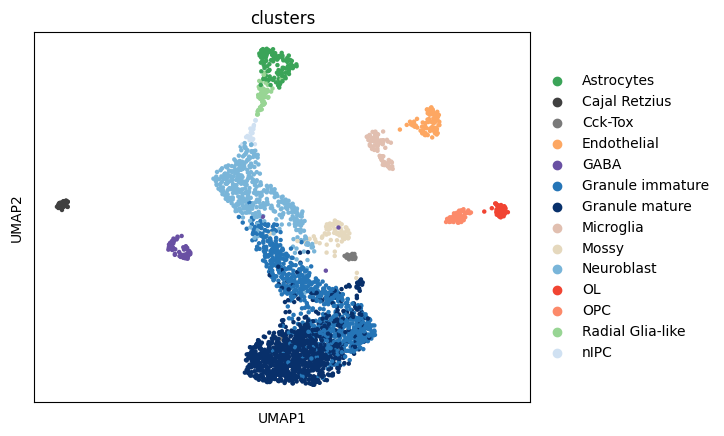

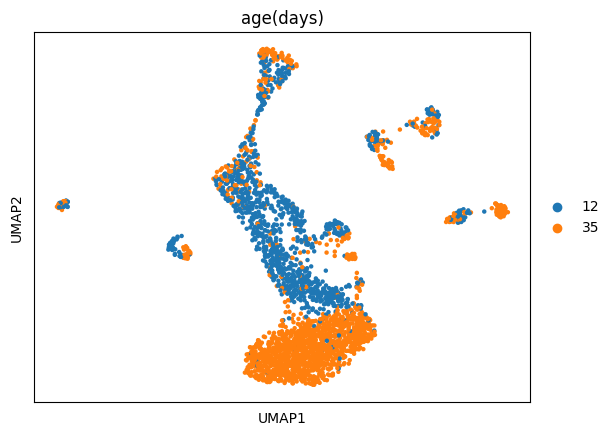

In [2]:
# from scvelo
adata = sc.read_h5ad("data/dentategyrus_scv.h5ad")  # same as 10X43_1.h5ad
print(adata)
sc.pl.umap(adata,color = 'clusters',save='DentateGyrus (P12 and P35).pdf')
# sc.pl.umap(adata,color = 'clusters',save='DentateGyrus (P12 and P35).png',show=False)
sc.pl.umap(adata,color = 'age(days)')

In [3]:
adata.obs['clusters'].value_counts()

Granule mature      1070
Granule immature     785
Neuroblast           417
Astrocytes           120
Endothelial           87
Microglia             81
Mossy                 75
GABA                  61
OPC                   53
Radial Glia-like      51
OL                    50
Cajal Retzius         34
Cck-Tox               27
nIPC                  19
Name: clusters, dtype: int64

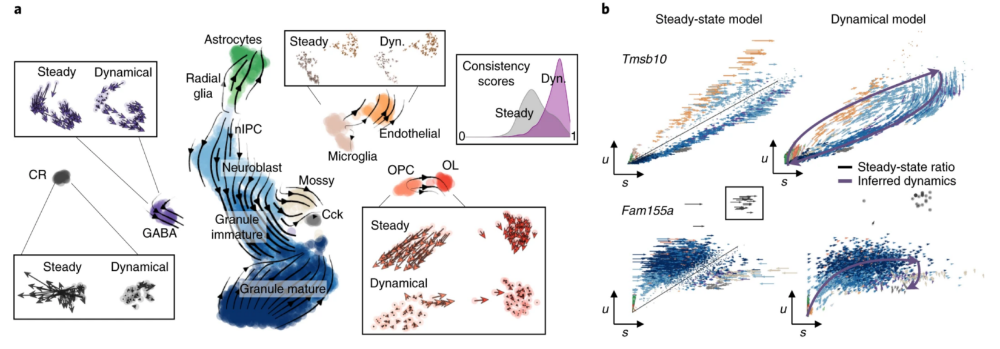

In [4]:
image = Image(filename='Figure/scvelo_DG.png')
display(image)

# DentateGyrus (P0 and P5)

AnnData object with n_obs × n_vars = 18213 × 27998
    obs: 'Age', 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'clusters_colors'
    obsm: 'X_tsne'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


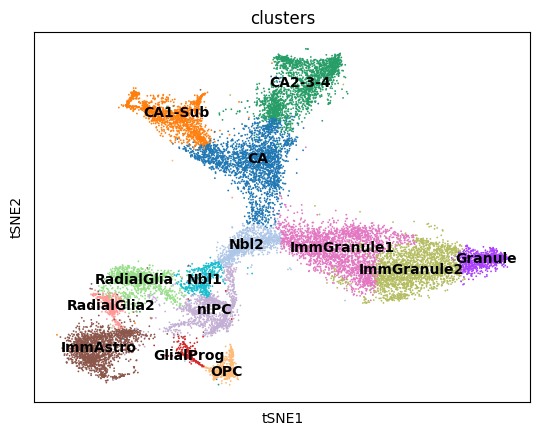

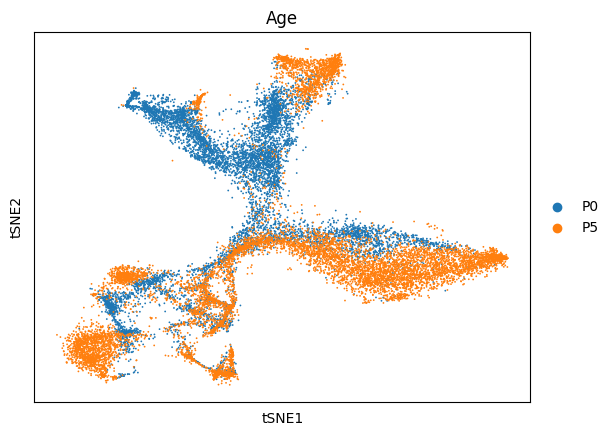

In [5]:
# from velocyto
# adata1 = sc.read_loom("data/DentateGyrus.loom")  # same loom
# print(adata1)
# adata = scv.datasets.dentategyrus_lamanno()
# adata.write_h5ad("data/DentateGyrus_velocyto.h5ad")

# from scvelo
adata = sc.read_h5ad("data/DentateGyrus_velocyto.h5ad")
print(adata)
sc.pl.tsne(adata,color='clusters',legend_loc="on data")
sc.pl.tsne(adata,color='Age')

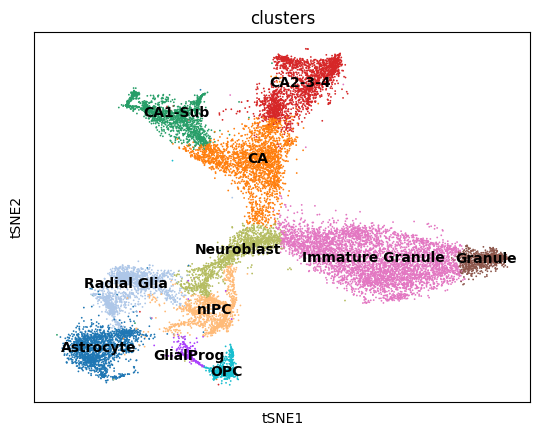

<AxesSubplot:title={'center':'clusters'}, xlabel='tSNE1', ylabel='tSNE2'>

In [6]:
replace_dict = {'RadialGlia': 'Radial Glia', 
                'RadialGlia2': 'Radial Glia',
                'ImmAstro': 'Astrocyte',
                'ImmGranule1':'Immature Granule',
                'ImmGranule2':'Immature Granule',
                'Nbl1':'Neuroblast',
                'Nbl2':'Neuroblast'
                }
adata.obs.replace(replace_dict, inplace=True)
sc.pl.tsne(adata,color='clusters',legend_loc="on data")
sc.pl.tsne(adata,color='clusters',save='DentateGyrus (P0 and P5).pdf',show=False)


In [7]:
adata.obs['clusters'].value_counts()

Immature Granule    4559
CA                  2298
CA2-3-4             2129
Astrocyte           1788
CA1-Sub             1664
Radial Glia         1431
Neuroblast          1422
nIPC                1230
Granule              863
OPC                  600
GlialProg            229
Name: clusters, dtype: int64

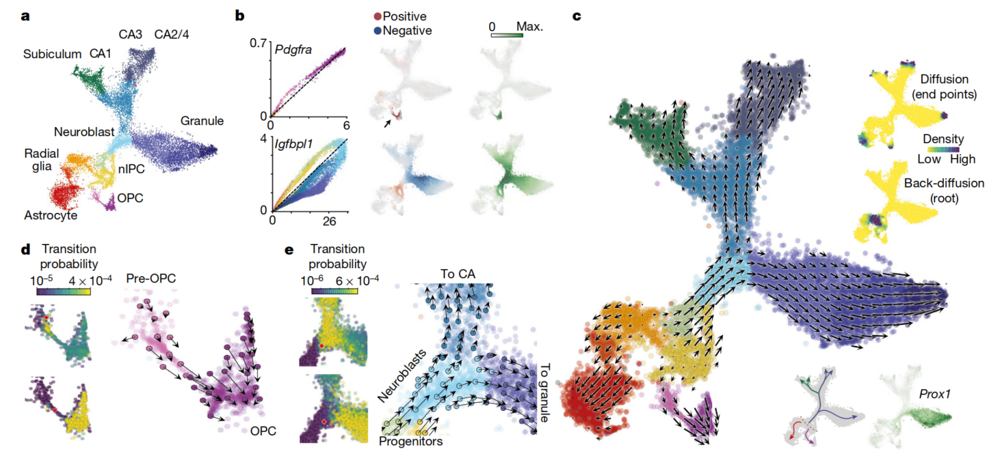

In [8]:
image = Image(filename='Figure/velocyto_DG.png')
display(image)

# Pancreatic Endocrinogenesis

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'


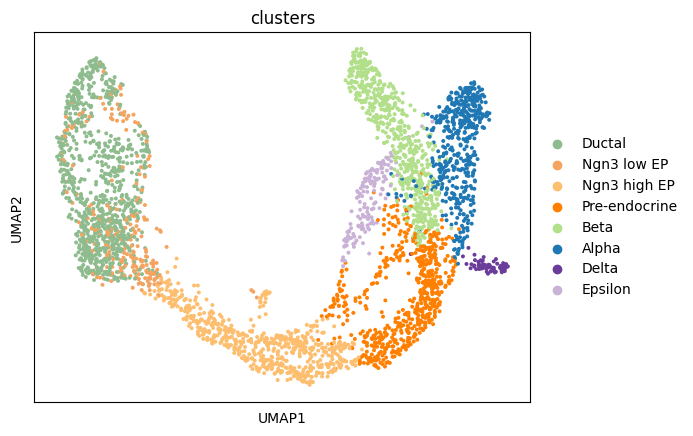

In [9]:
# from scvelo
adata = sc.read_h5ad("data/endocrinogenesis_day15.h5ad")
print(adata)
sc.pl.umap(adata,color = 'clusters',save='Pancreatic Endocrinogenesis.pdf')

In [10]:
adata.obs['clusters'].value_counts()

Ductal           916
Ngn3 high EP     642
Pre-endocrine    592
Beta             591
Alpha            481
Ngn3 low EP      262
Epsilon          142
Delta             70
Name: clusters, dtype: int64

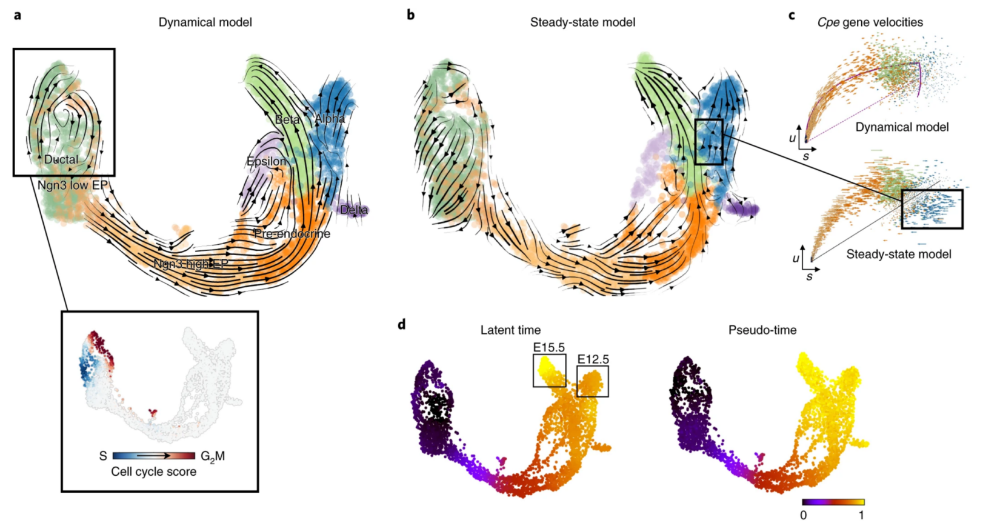

In [11]:
image = Image(filename='Figure/endo.png')
display(image)

# CD34+ Bone Marrow (BM)

AnnData object with n_obs × n_vars = 5780 × 14319
    obs: 'clusters', 'palantir_pseudotime'
    uns: 'clusters_colors'
    obsm: 'X_tsne'
    layers: 'spliced', 'unspliced'


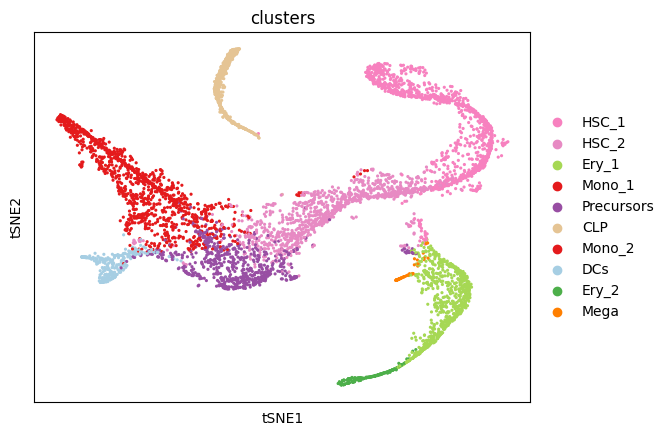

In [12]:
# from scvelo
adata = sc.read_h5ad("data/human_cd34_bone_marrow.h5ad")
# adata = scv.datasets.bonemarrow()
print(adata)
sc.pl.tsne(adata,color = 'clusters',save="CD34+ Bone Marrow (BM).pdf")

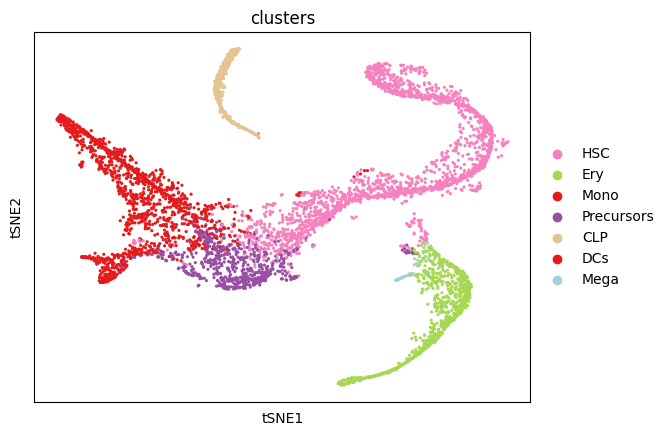

In [13]:
replace_dict = {'HSC_1': 'HSC', 
                'HSC_2': 'HSC',
                'Ery_1': 'Ery', 
                'Ery_2': 'Ery',
                'Mono_1': 'Mono', 
                'Mono_2': 'Mono'}
adata.obs.replace(replace_dict, inplace=True)
adata.obs['clusters'] = pd.Categorical(adata.obs['clusters'], ordered=True, 
                                       categories=['HSC', 'Ery', 'Mono','Precursors','CLP','DCs','Mega'])
adata.uns['clusters_colors'] = ['#f781bf', '#a6d854', '#e41a1c', '#984ea3', '#e5c494','#e41a1c', '#a6cee3', '#ff7f00']
sc.pl.tsne(adata,color='clusters')

In [14]:
adata.obs['clusters'].value_counts()

HSC           2102
Mono          1153
Ery           1007
Precursors     666
CLP            488
DCs            303
Mega            61
Name: clusters, dtype: int64

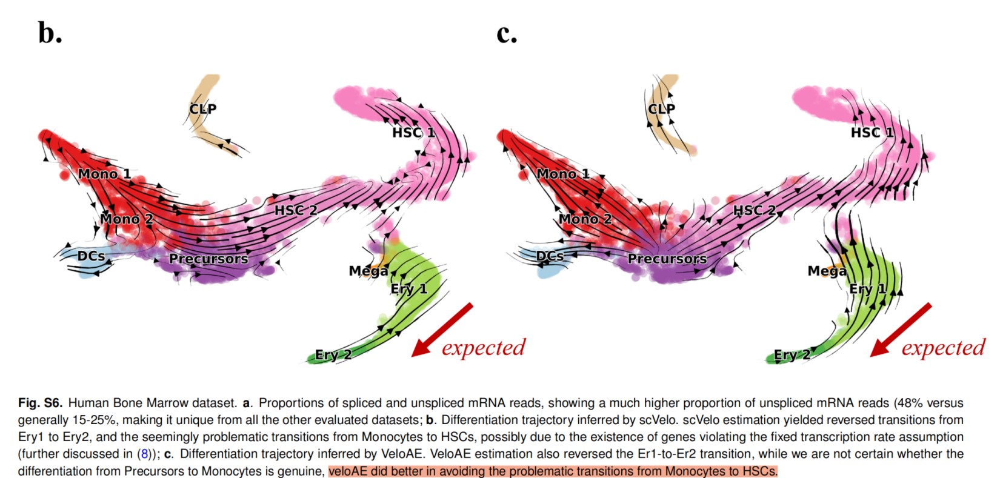

In [15]:
image = Image(filename='Figure/CD34BM.png')
display(image)

# Gastrulation (all cells )

AnnData object with n_obs × n_vars = 89267 × 53801
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'cell_velocyto_loom'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'


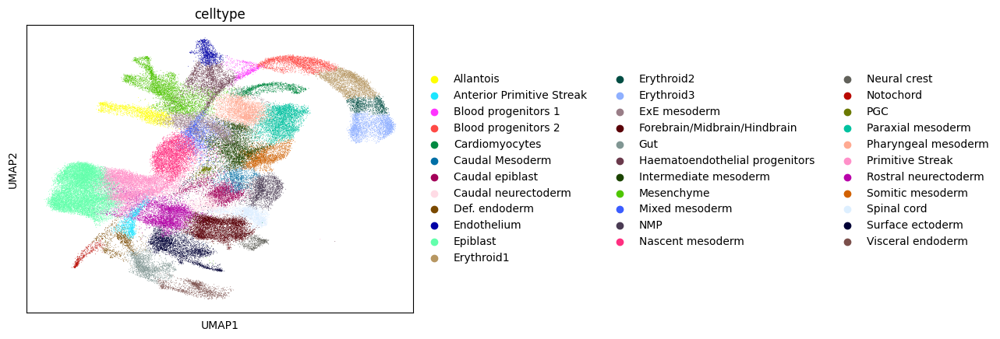

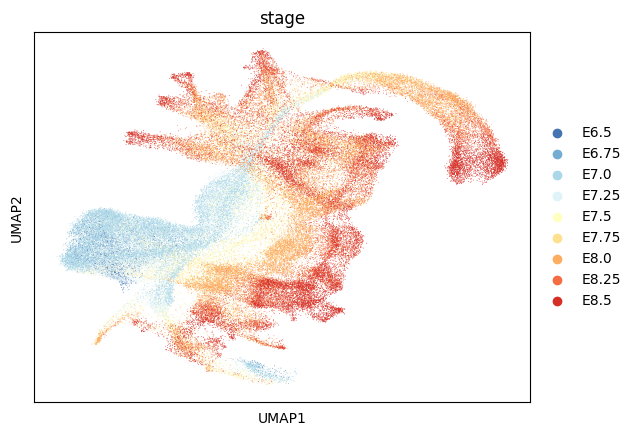

In [16]:
# from scvelo
# adata = scv.datasets.gastrulation()
adata = sc.read_h5ad("data/Gastrulation/gastrulation.h5ad")
print(adata)
sc.pl.umap(adata,color=['celltype'])

adata.obs['stage'] = pd.Categorical(adata.obs['stage'], ordered=True, 
                                       categories=['E6.5','E6.75',
                                                   'E7.0','E7.25','E7.5','E7.75',
                                                   'E8.0','E8.25','E8.5'])
sc.pl.umap(adata,color=['stage'],palette=sns.color_palette("RdYlBu", 9)[::-1],save='Gastrulation.pdf')

In [17]:
adata.obs['stage'].value_counts()

E8.5     16361
E8.25    15042
E8.0     14534
E7.0     11277
E7.25    10508
E7.75    10153
E7.5      7202
E6.5      2715
E6.75     1475
Name: stage, dtype: int64

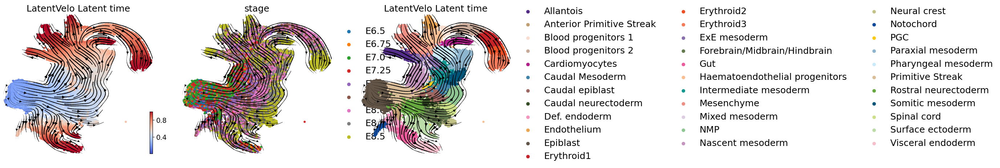

In [18]:
image = Image(filename='Figure/latentvelo_gastru.png')
display(image)

# Gastrulation Erythroid 

AnnData object with n_obs × n_vars = 9815 × 53801
    obs: 'sample', 'stage', 'sequencing.batch', 'theiler', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'MURK_gene', 'Δm', 'scaled Δm'
    uns: 'celltype_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'


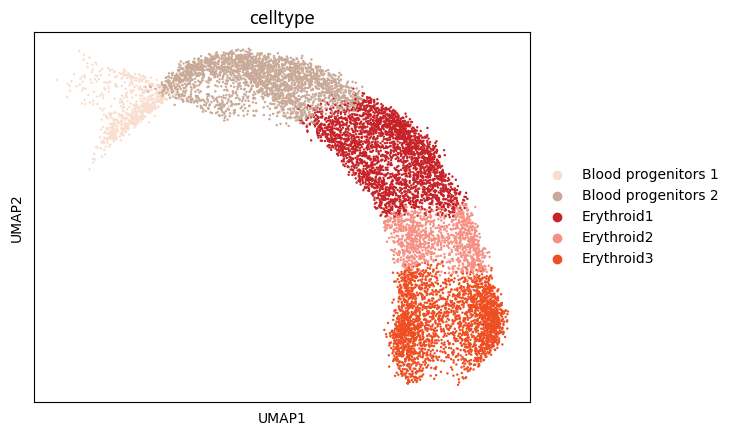

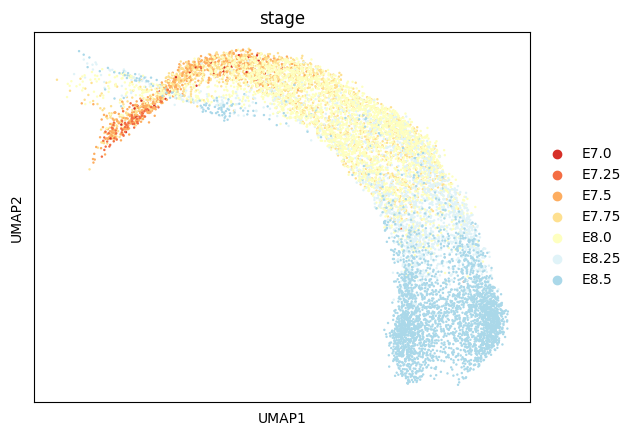

In [19]:
# from GB Ery, scvelo
adata = sc.read_h5ad("data/erythroid_lineage.h5ad")
print(adata)
sc.pl.umap(adata,color = 'celltype')
sc.pl.umap(adata,color = 'stage',palette=sns.color_palette("RdYlBu", 9))

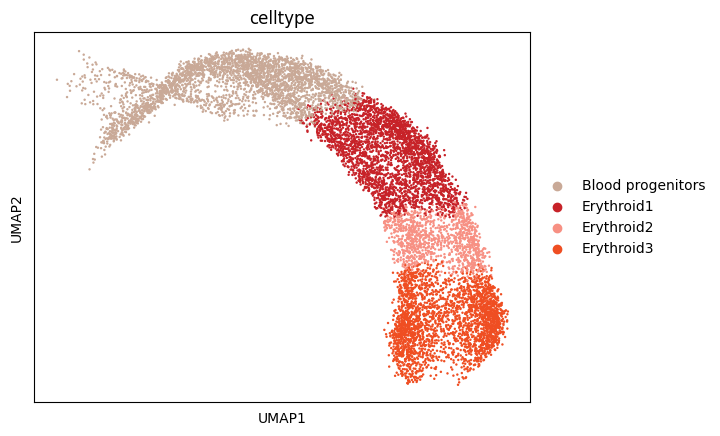

In [20]:
replace_dict = {'Blood progenitors 1': 'Blood progenitors',
                'Blood progenitors 2': 'Blood progenitors',
                }
adata.obs.replace(replace_dict, inplace=True)
adata.uns['celltype_colors'] = ['#c9a997', '#C72228', '#f79083', '#EF4E22']
sc.pl.umap(adata,color = 'celltype',save='Gastrulation Erythroid.pdf')

In [21]:
adata.obs['celltype'].value_counts()

Blood progenitors    3083
Erythroid1           2929
Erythroid3           2697
Erythroid2           1106
Name: celltype, dtype: int64

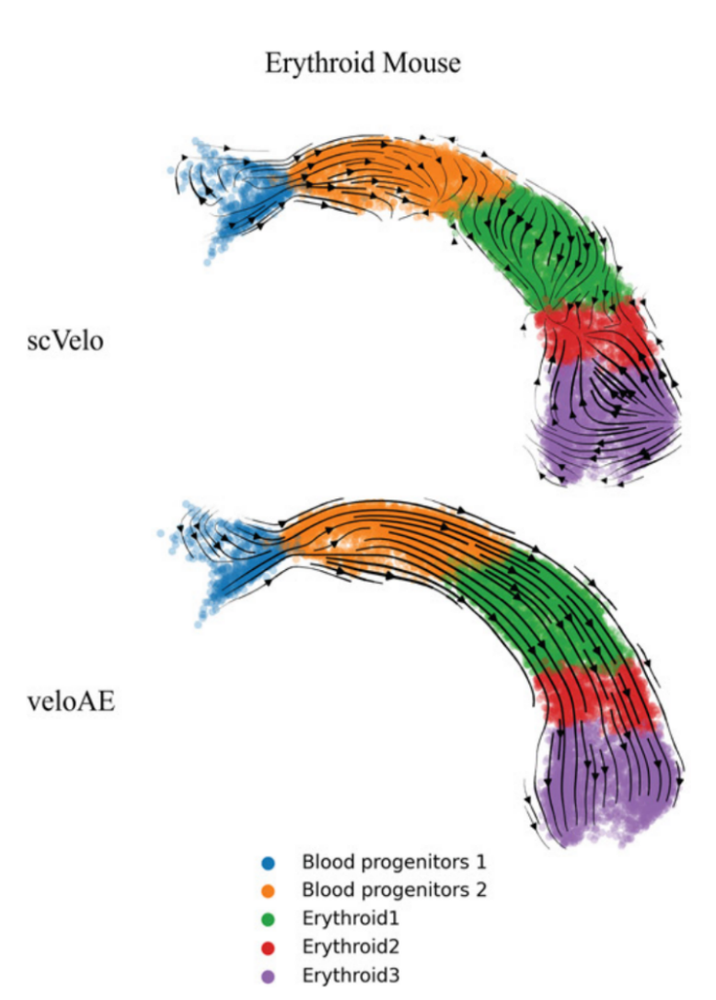

In [22]:
image = Image(filename='Figure/ery.png')
display(image)

# Hindbrain

AnnData object with n_obs × n_vars = 13501 × 55421
    obs: 'TotalUMIs', 'barcode', 'Celltype', 'Lineage', 'Timepoint'
    var: 'Accession', 'AccessionVersion', 'Aliases', 'CcdsID', 'Chromosome', 'ChromosomeEnd', 'ChromosomeStart', 'CosmicID', 'DnaBindingDomain', 'FullName', 'GeneType', 'HgncID', 'IsTFi (TcoF-DB)', 'Location', 'LocationSortable', 'LocusGroup', 'LocusType', 'MgdID', 'MirBaseID', 'OmimID', 'PubmedID', 'RefseqID', 'Regulates (TRRUST)', 'RgdID', 'Strand', 'UcscID', 'UniprotID', 'VegaID'
    obsm: 'X_tsne'
    layers: 'matrix', 'spliced', 'unspliced'


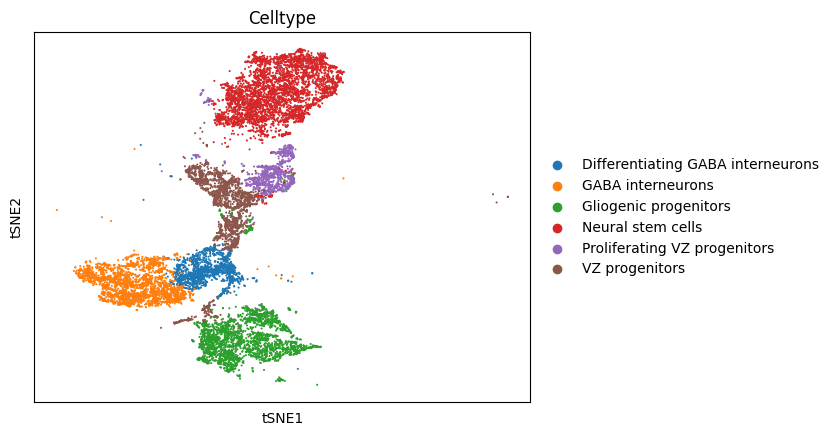

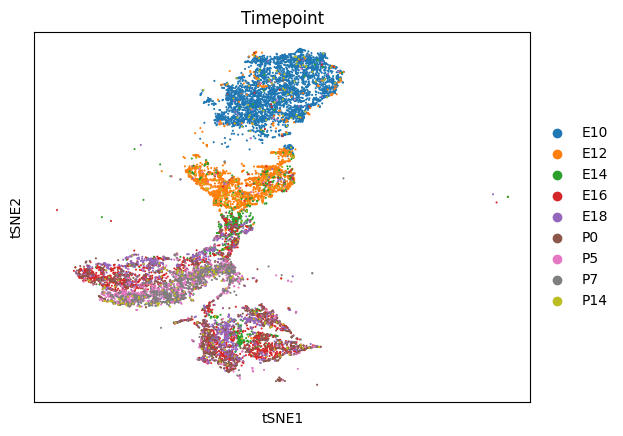

In [23]:
# from deepvelo(GB)
adata = sc.read_h5ad("data/Hindbrain_GABA_Glio.h5ad")
print(adata)
sc.pl.tsne(adata,color='Celltype',save='Hindbrain.pdf')
sc.pl.tsne(adata,color='Timepoint')

In [24]:
adata.obs['Celltype'].value_counts()

Neural stem cells                    3938
Gliogenic progenitors                2691
GABA interneurons                    2414
VZ progenitors                       1962
Differentiating GABA interneurons    1410
Proliferating VZ progenitors         1086
Name: Celltype, dtype: int64

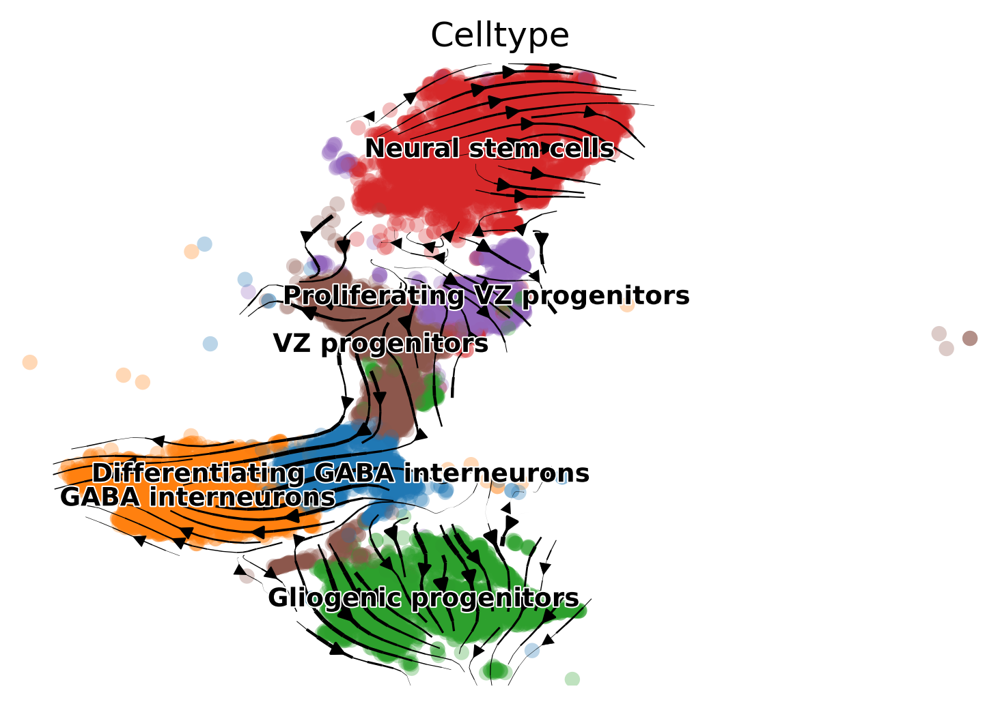

In [25]:
image = Image(filename='Figure/dp_hindbrain.png')
display(image)

# Organogenesis

AnnData object with n_obs × n_vars = 30000 × 2000
    obs: 'sex', 'day', 'Total_mRNAs.x', 'Main_Cluster.x', 'Sub_Cluster', 'db_score', 'detected_doublet.x', 'potential_doublet_cluster', 'sample_group', 'cb', 'run', 'all_exon_count', 'all_intron_count', 'all_read_count', 'intergenic_rate', 'embryo_id', 'embryo_sex', 'nuclei_extraction_date', 'development_stage', 'Total_mRNAs.y', 'num_genes_expressed', 'Size_Factor', 'Main_Cluster.y', 'Sub_cluster', 'doublet_score', 'detected_doublet.y', 'doublet_cluster', 'sub_cluster_id', 'Main_cell_type', 'Main_trajectory', 'Main_trajectory_refined_by_cluster', 'Sub_trajectory_name', 'Sub_trajectory_louvain_component', 'Sub_trajectory_Pseudotime', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'Main_cell_type_colors', 'log1p'
    obsm: 'Main_cluster_tsne', 'Main_trajectory_refined_umap', 'Main_trajectory_umap', 'Sub_cluster_

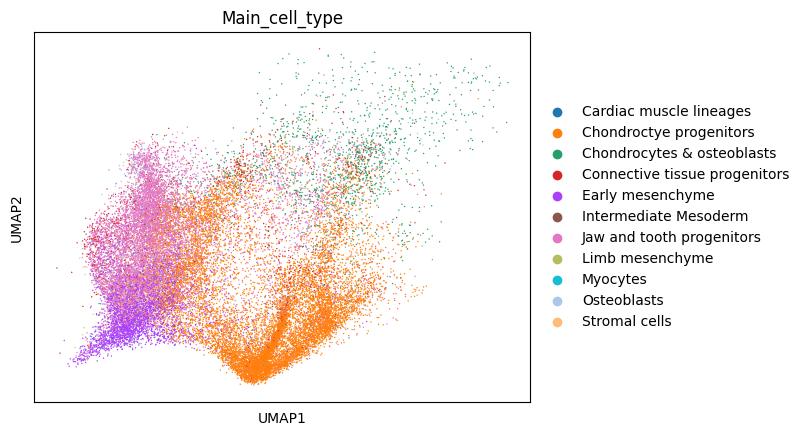

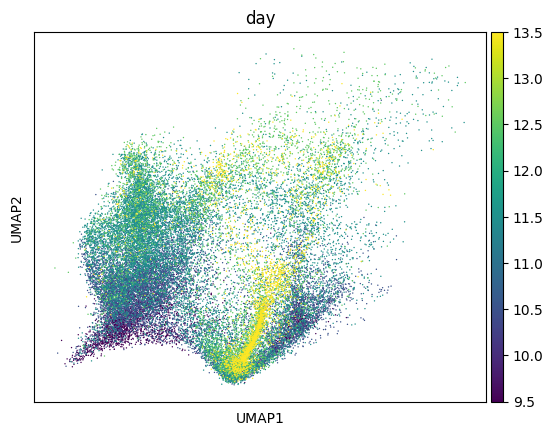

In [26]:
# from deepvelo (GB) 
# adata = sc.read_h5ad("data/cao_organogenesis_chondrocyte.h5ad")
# # process as deepvelo
# adata = adata[np.random.choice(adata.obs_names, 30000, replace=False)]
# adata.X = adata.layers["spliced"] + adata.layers["unspliced"] + adata.layers["ambiguous"]
# scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
# adata.obsm["X_umap"] = adata.obsm["Main_trajectory_refined_umap"]
# adata.write_h5ad("data/organogenesis_chondrocyte.h5ad")

adata = sc.read_h5ad("data/organogenesis_chondrocyte.h5ad")
print(adata)
sc.pl.umap(adata,color='Main_cell_type',save='organogenesis')
sc.pl.umap(adata,color='day')

In [27]:
adata.obs['Main_cell_type'].value_counts()

Chondroctye progenitors          13220
Jaw and tooth progenitors         8975
Early mesenchyme                  3593
Chondrocytes & osteoblasts        1466
Connective tissue progenitors     1002
Stromal cells                      968
Osteoblasts                        459
Intermediate Mesoderm              229
Limb mesenchyme                     41
Cardiac muscle lineages             39
Myocytes                             8
Name: Main_cell_type, dtype: int64

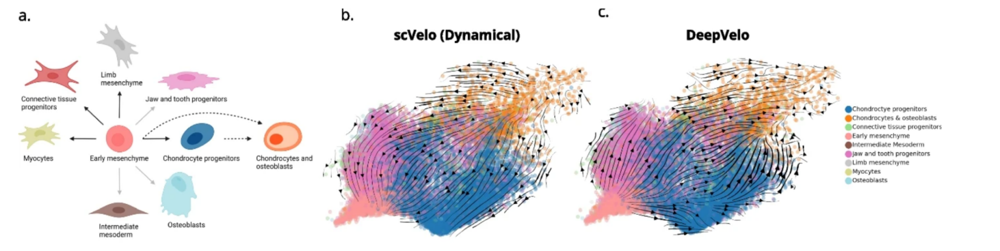

In [28]:
image = Image(filename='Figure/organ.png')
display(image)

# Zebrafish

AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch'
    uns: 'Cell_type_colors'
    obsm: 'X_umap'
    layers: 'spliced', 'unspliced'


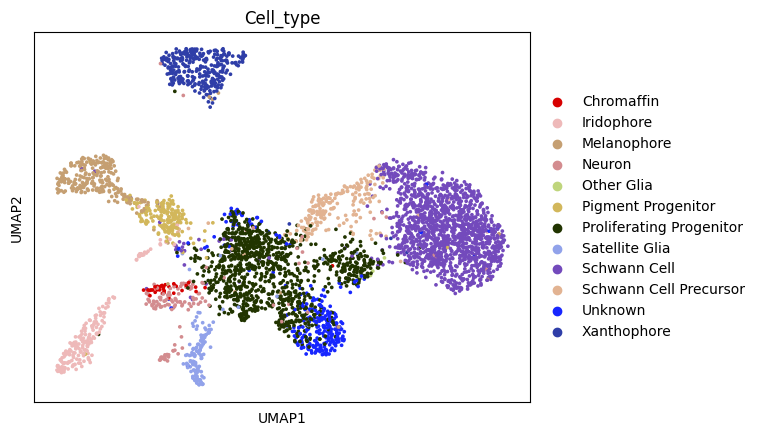

In [29]:
# from dynamo
# adata = sc.read_h5ad("data/zebrafish.h5ad")
# print(adata)

# original UMAP
# emb = adata.obs[['umap_1', 'umap_2']]
# adata.obsm['X_umap'] = emb.values
# sc.pl.umap(adata,color= 'Cell_type')

# dynamo process get new umap 
# preprocessor = dyn.pp.Preprocessor(cell_cycle_score_enable=True)
# preprocessor.config_monocle_recipe(adata)
# preprocessor.filter_cells_by_outliers_kwargs["keep_filtered"] = True
# preprocessor.preprocess_adata_monocle(adata)
# dyn.tl.reduceDimension(adata)
# dyn.pl.umap(adata, color='Cell_type')
# adata_raw = dyn.sample_data.zebrafish()
# adata_raw.obsm['X_umap'] = adata.obsm['X_umap']
# adata_raw.uns['Cell_type_colors'] = adata.uns['Cell_type_colors']
# adata_raw.write_h5ad('data/zebrafish_process.h5ad')

adata = sc.read_h5ad('data/zebrafish_process.h5ad')
print(adata)
sc.pl.umap(adata,color='Cell_type',palette=adata.uns['Cell_type_colors'],save='Zebrafish.pdf')

In [30]:
adata.obs['Cell_type'].value_counts()

Schwann Cell                1437
Proliferating Progenitor    1022
Xanthophore                  314
Unknown                      272
Melanophore                  255
Schwann Cell Precursor       210
Iridophore                   198
Pigment Progenitor           172
Neuron                       137
Satellite Glia               126
Chromaffin                    34
Other Glia                     4
Name: Cell_type, dtype: int64

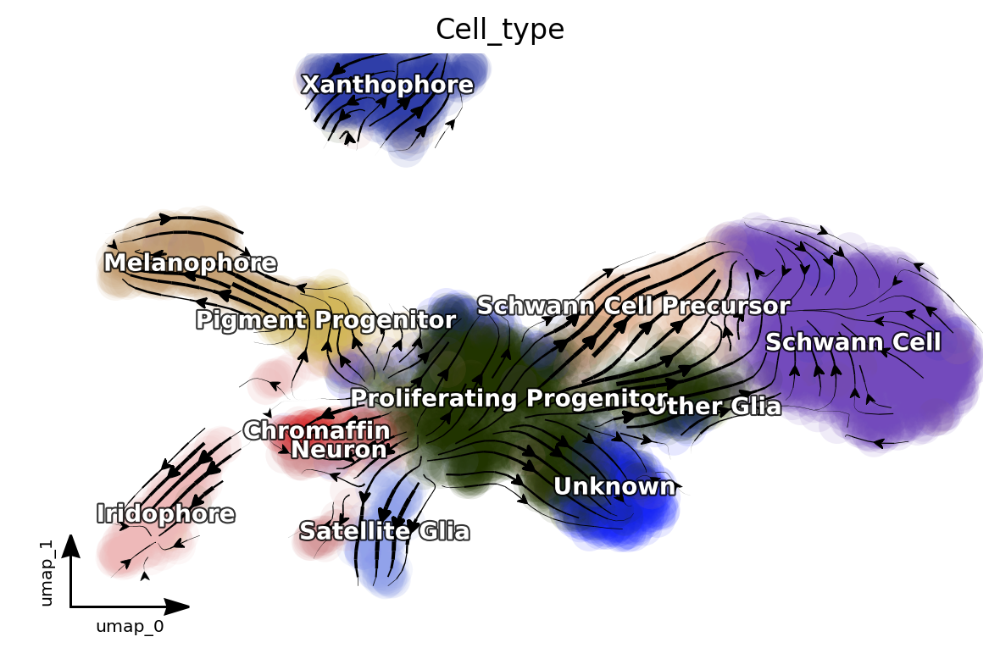

In [31]:
image = Image(filename="Figure/dynamo_zebrafish.png")
display(image)

# Forebrain

AnnData object with n_obs × n_vars = 1720 × 32738
    obs: 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


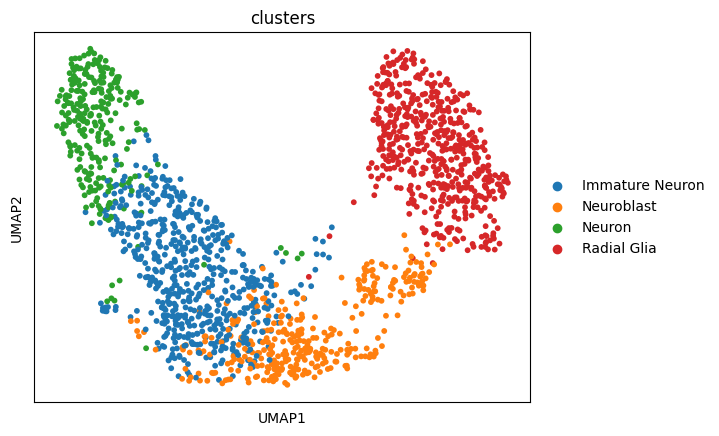

In [32]:
# adata = sc.read_loom("data/hgForebrainGlut.loom")  from velocyto
# print(adata)
# adata = scv.datasets.forebrain()

# adata = sc.read_h5ad("data/data-ForebrainGlut-hgForebrainGlut.h5ad")  # from scvelo, same as velocyto
# print(adata)

# df = pd.read_csv("data/HgForebrainGlut_cellDancer_estimation_spliced.csv") # from celldancer

# emb = df[['cellID', 'embedding1', 'embedding2']].drop_duplicates()
# emb = emb.set_index('cellID')

# obs = df[['cellID', 'clusters']].drop_duplicates()
# obs = obs.set_index('cellID')

# adata = adata[emb.index]
# emb = emb.loc[adata.obs.index,:].values
# adata.obsm['X_umap'] = emb
# adata.obs = obs
# adata.write_h5ad("data/Forebrain.h5ad")

adata = sc.read_h5ad("data/Forebrain.h5ad")
print(adata)
sc.pl.umap(adata,color="clusters",save='Forebrain.pdf')

In [33]:
adata.obs['clusters'].value_counts()

Immature Neuron    590
Radial Glia        519
Neuroblast         343
Neuron             268
Name: clusters, dtype: int64

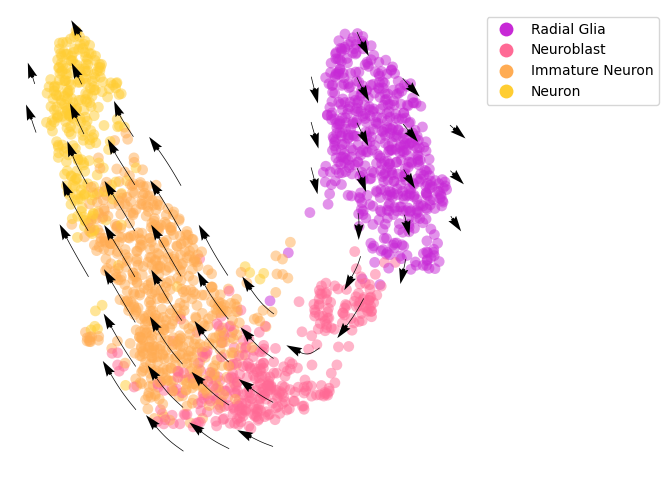

In [34]:
image = Image(filename="Figure/hgforebrain.png")
display(image)